# 音频可视化程序
参考

1. [你可见过五彩斑斓的音乐？【manim动画】【音乐可视化】](https://www.bilibili.com/video/BV1tE411x7xM/?p=2&share_source=copy_web&vd_source=d1a57027b2655bfb6dc177f8a435b353)

2. [绘制优美的图像](https://waterprogramming.wordpress.com/tag/visualization/)

In [2]:
# 引用库文件
import numpy as np
import matplotlib.pyplot as plt
from scipy.io.wavfile import read,write
from IPython.display import Audio
%matplotlib inline

In [3]:
Fs,data = read('audio/Pwiis-oscillofun.wav')
# Fs,data = read('audio/Time travel.wav')
data_x = data[:,0] # 两个声道
data_y = data[:,1]
print("Sampling Frequency is", Fs)
Audio(data_x,rate=Fs)

Sampling Frequency is 44100


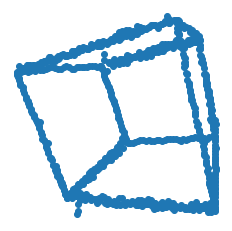

In [7]:
frame = 60*146 # 视频截取图像的张数
number_of_dot = np.size(data,0) # 总共的点数
dot_in_one_frame=int(number_of_dot/frame) # 出现在一帧视频中的点数

# 选取第X帧
X = 45*60+4

# 下面是视频中第X帧的图像，我们的任务是继续画出8760帧的图像
fig = plt.figure()
ax = fig.add_subplot(111)
plt.scatter(data_x[X*dot_in_one_frame:(X+1)*dot_in_one_frame],
        data_y[X*dot_in_one_frame:(X+1)*dot_in_one_frame])

plt.axis('off')
ax.set_aspect('equal', adjustable='box')
plt.show()

## 接下来就是用matplotlib将每一帧给“画出来”
由于所有的图像都是实时处理完成的。

In [4]:
# 在命令行之外输出，这里有个小bug，需要重启kurnel或者是等它放完才能退出matplotlib循环
%matplotlib
import matplotlib.animation as animation
import os
from IPython.display import clear_output

number_of_dot = np.size(data,0) # 总共的点数
total_time = int(number_of_dot/Fs)
frame = 60*total_time # 视频截取图像的张数
dot_in_one_frame=int(number_of_dot/frame) # 出现在一帧视频中的点数

fig = plt.figure()
ax = fig.add_subplot(111)
(line1,) = ax.plot(data_x, data_y)


for f in range(frame):
    ax.set_aspect('equal', adjustable='box')
    plt.axis('off')
    plt.scatter(data_x[f*dot_in_one_frame:(f+1)*dot_in_one_frame],
        data_y[f*dot_in_one_frame:(f+1)*dot_in_one_frame])
    plt.pause(1/120)
    plt.clf()   



Using matplotlib backend: QtAgg


QStandardPaths: XDG_RUNTIME_DIR not set, defaulting to '/tmp/runtime-miakho'


# 使用Manim复现
到此为止，核心部分已经结束，剩下的内容就用Manim复现，复现部分主要完成两个功能
1. 使用散点图绘制
2. 形成视频

In [3]:
# 引入头文件
from manim import *

In [14]:
%%manim -ql  -v WARNING LagRatios
# 显示点的原理

class LagRatios(Scene):
    def construct(self):
        ratios = [0, 0.1, 0.5, 1, 2]  # demonstrated lag_ratios

        # Create dot groups
        group = VGroup(*[Dot() for _ in range(4)]).arrange_submobjects()
        groups = VGroup(*[group.copy() for _ in ratios]).arrange_submobjects(buff=1)
        self.add(groups)

        # Label groups
        self.add(Text("lag_ratio = ", font_size=36).next_to(groups, UP, buff=1.5))
        for group, ratio in zip(groups, ratios):
            self.add(Text(str(ratio), font_size=36).next_to(group, UP))

        #Animate groups with different lag_ratios
        self.play(AnimationGroup(*[
            group.animate(lag_ratio=ratio, run_time=1.5).shift(DOWN * 2)
            for group, ratio in zip(groups, ratios)
        ]))

        # lag_ratio also works recursively on nested submobjects:
        self.play(groups.animate(run_time=1, lag_ratio=0.1).shift(UP * 2))

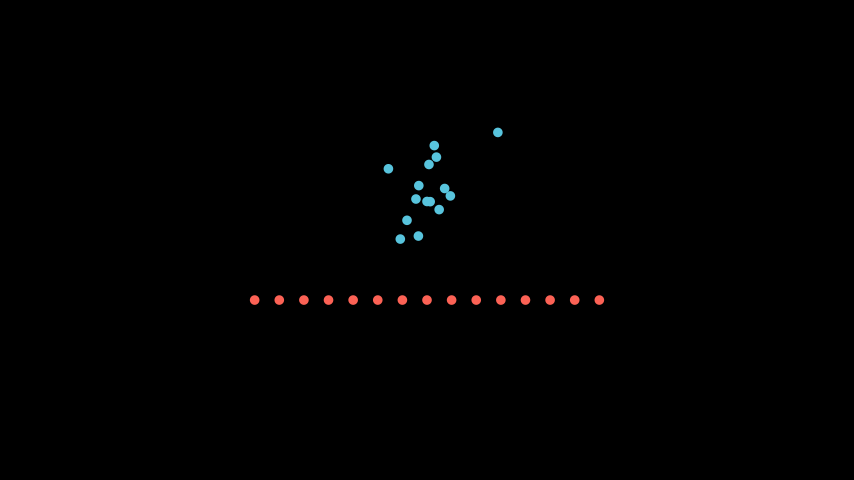

In [16]:
%%manim -ql -v WARNING ArrangeSumobjectsExample
# 可以使用shift来绘制散点图

class ArrangeSumobjectsExample(Scene):
    def construct(self):
        s= VGroup(*[Dot().shift(i*0.1*RIGHT*np.random.uniform(-1,1)+UP*np.random.uniform(-1,1)) for i in range(0,15)])
        s.shift(UP).set_color(BLUE)
        s2= s.copy().set_color(RED)
        s2.arrange_submobjects()
        s2.shift(DOWN)
        self.add(s,s2)

## 一些可以改进的地方

1. 可能是由于manim使用wait()本身的限制，在生成0.1以内的数字时，总时间会变成0，所以视频不能严格按照音频时间来生成总时间。需要后期处理。
2. 生成一帧所需要的时间实在是太多了，可能有其他更好的算法或者是实现方式我没有注意到，毕竟使用matplotlib几乎可以立马完成（如上文所示）。
3. 我没有跑完所有视频帧，因为跑完实在是太耗时间了。（我还是用的480p画质）

In [1]:
from manim import *

Manim Community v0.17.2

In [5]:
%%manim -ql -v WARNING DotExample

# 这一段代码会运行很久，生成一段一秒钟的动画差不多要五分钟，慎重考虑运行。也就说明推算一下生成146秒大概要用12个小时。
import numpy as np
import matplotlib.pyplot as plt
from scipy.io.wavfile import read,write
from IPython.display import Audio

# 读取音频参数
Fs,data = read('audio/Pwiis-oscillofun.wav')
data_x = data[:,0] # 两个声道
data_y = data[:,1]
number_of_dot = np.size(data,0) # 总共的点数

# 计算
frame = 60*146 # 60帧*146秒，是图片的数量
dot_in_one_frame=int(number_of_dot/frame) # 出现在一帧视频中的点数

# 确保所有的数字在画面中
min_number = min([min(data_x),min(data_y)])
max_number = max([max(data_x),max(data_y),abs(min_number)])
interval = max_number/4

# 生成音频对应一秒钟的动画
length_of_time = 1
# length_of_time = 146 # 总共有146秒，如果你不怕执行十二小时的程序就取消这一行的注释

# 动画
class DotExample(Scene):
    def construct(self):
        def in_frame(f):
            s= VGroup(*[Dot(radius=0.04).shift(data_x[i]/interval*RIGHT+data_y[i]/interval*UP) for i in range(f*dot_in_one_frame,(f+1)*dot_in_one_frame)])
            self.add(s)

        for i in range(60*length_of_time):
            in_frame(i)
            self.wait(0.1) # 每帧之间大概停顿0.017秒
            self.clear()
            